<a href="https://colab.research.google.com/github/Muhammad-Talha-MT/AOA/blob/master/Detectron2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [10]:
%cd /content/drive/My Drive
%pwd

/content/drive/My Drive


'/content/drive/My Drive'

In [3]:
%ls

'=2.0.1'
 car/
 coco_eval/
'Colab Notebooks'/
 FYP/
'images?q=tbn:ANd9GcTTOjLUFZNMCcW6BX73M-D4j4e_mfaU1AjFow'
'images?q=tbn:ANd9GcTTOjLUFZNMCcW6BX73M-D4j4e_mfaU1AjFow.1'
'images?q=tbn:ANd9GcTTOjLUFZNMCcW6BX73M-D4j4e_mfaU1AjFow.2'
'images?q=tbn:ANd9GcTTOjLUFZNMCcW6BX73M-D4j4e_mfaU1AjFow.3'
'images?q=tbn:ANd9GcTTOjLUFZNMCcW6BX73M-D4j4e_mfaU1AjFow.4'
 input.jpg
 output/


In [4]:
# install dependencies: 
!pip install pyyaml==5.1 pycocotools>=2.0.1
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
# opencv is pre-installed on colab

1.6.0+cu101 True
gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
Copyright (C) 2017 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.



In [5]:
# install detectron2: (Colab has CUDA 10.1 + torch 1.6)
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
assert torch.__version__.startswith("1.6")
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.6/index.html

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.6/index.html
     |████████████████████████████████| 6.6MB 374kB/s 
     |████████████████████████████████| 2.2MB 5.2MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.2.post20201016-cp36-none-any.whl size=44196 sha256=fdf175d3743ee5ba9146ac9b65449274cc889861c4100bd6b419c781cd533287
  Stored in directory: /root/.cache/pip/wheels/f3/3f/35/86873c1ddea45a9fb1ba7921232ea15c570165a9d4f4d831c7
Successfully built fvcore
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Found existing installation: Pillow 7.0.0
    Uninstalling Pillow-7.0.0:
      Successfully uninstalled Pillow-7.0.0


In [1]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [12]:
from detectron2.data.datasets import register_coco_instances

register_coco_instances("car_doors_train", {}, "/content/drive/My Drive/car/train/_annotations.coco.json", "/content/drive/My Drive/car/train/")
register_coco_instances("car_doors_val", {}, "/content/drive/My Drive/car/valid/_annotations.coco.json", "/content/drive/My Drive/car/valid")

WARNING [10/17 08:27:23 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[10/17 08:27:23 d2.data.datasets.coco]: Loaded 59 images in COCO format from /content/drive/My Drive/car/train/_annotations.coco.json


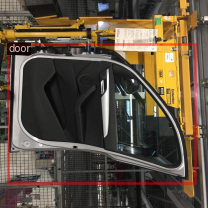

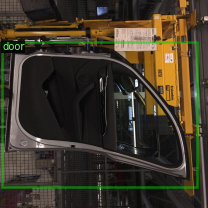

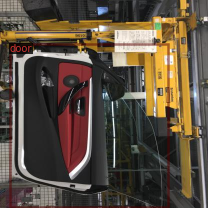

In [ ]:
#visualize training data
my_dataset_train_metadata = MetadataCatalog.get("car_doors_train")
dataset_dicts = DatasetCatalog.get("car_doors_train")
import random
from detectron2.utils.visualizer import Visualizer
for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

In [7]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
import os
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")) #Get the basic model configuration from the model zoo

In [16]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
import os
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")) #Get the basic model configuration from the model zoo 
#Passing the Train and Validation sets
cfg.DATASETS.TRAIN = ("car_doors_train",)
cfg.DATASETS.TEST = ("car_doors_val",)
# Number of data loading threads
cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
# Number of images per batch across all machines.
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.0125  # pick a good LearningRate
cfg.SOLVER.MAX_ITER = 300  #No. of iterations   
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 256  
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 3 # No. of classes = [HINDI, ENGLISH, OTHER]
cfg.TEST.EVAL_PERIOD = 500 # No. of iterations after which the Validation Set is evaluated. 
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[10/19 08:38:41 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_280758.pkl: 167MB [00:11, 14.7MB/s]                           
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (12, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (12,) in the model! You might want to double check if this is expected.


[10/19 08:39:00 d2.engine.train_loop]: Starting training from iteration 0
[10/19 08:39:39 d2.utils.events]:  eta: 0:09:12  iter: 19  total_loss: 1.284  loss_cls: 1.066  loss_box_reg: 0.189  loss_rpn_cls: 0.011  loss_rpn_loc: 0.006  time: 1.8908  data_time: 0.0786  lr: 0.000250  max_mem: 3320M
[10/19 08:40:18 d2.utils.events]:  eta: 0:08:31  iter: 39  total_loss: 0.385  loss_cls: 0.190  loss_box_reg: 0.189  loss_rpn_cls: 0.006  loss_rpn_loc: 0.004  time: 1.8879  data_time: 0.0174  lr: 0.000500  max_mem: 3320M
[10/19 08:40:56 d2.utils.events]:  eta: 0:07:52  iter: 59  total_loss: 0.256  loss_cls: 0.081  loss_box_reg: 0.169  loss_rpn_cls: 0.001  loss_rpn_loc: 0.003  time: 1.8910  data_time: 0.0157  lr: 0.000749  max_mem: 3320M
[10/19 08:41:32 d2.utils.events]:  eta: 0:06:58  iter: 79  total_loss: 0.214  loss_cls: 0.050  loss_box_reg: 0.164  loss_rpn_cls: 0.000  loss_rpn_loc: 0.003  time: 1.8719  data_time: 0.0152  lr: 0.000999  max_mem: 3320M
[10/19 08:42:08 d2.utils.events]:  eta: 0:06:0

In [17]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

In [6]:
# cfg already contains everything we've set previously. Now we changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

NameError: ignored

WARNING [10/19 08:49:14 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[10/19 08:49:14 d2.data.datasets.coco]: Loaded 5 images in COCO format from /content/drive/My Drive/car/valid/_annotations.coco.json


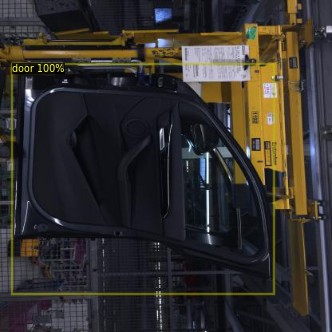

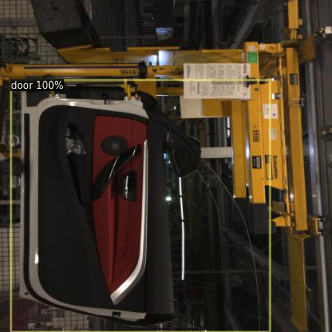

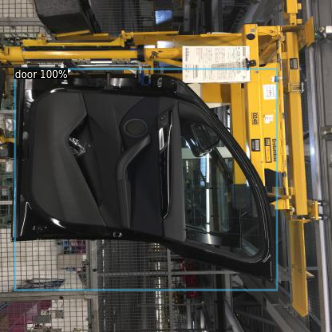

In [18]:
#Use the final weights generated after successful training for inference  
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")

cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.8  # set the testing threshold for this model
#Pass the validation dataset
cfg.DATASETS.TEST = ("car_doors_val",)

predictor = DefaultPredictor(cfg)
my_dataset_valid_metadata = MetadataCatalog.get("car_doors_val")
dataset_dicts = DatasetCatalog.get("car_doors_val")
for d in random.sample(dataset_dicts, 3):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=my_dataset_valid_metadata, 
                   scale=0.8,
                    
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu")) #Passing the predictions to CPU from the GPU
    cv2_imshow(v.get_image()[:, :, ::-1])

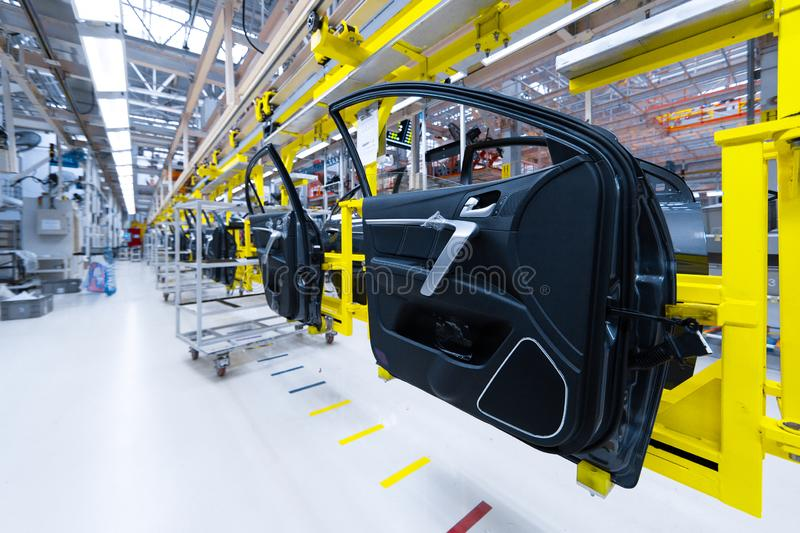

In [19]:
!wget https://thumbs.dreamstime.com/b/preparation-installation-body-part-car-factory-door-car-production-line-preparation-doors-installation-132429659.jpg -q -O input.jpg
im = cv2.imread("./input.jpg")
cv2_imshow(im)

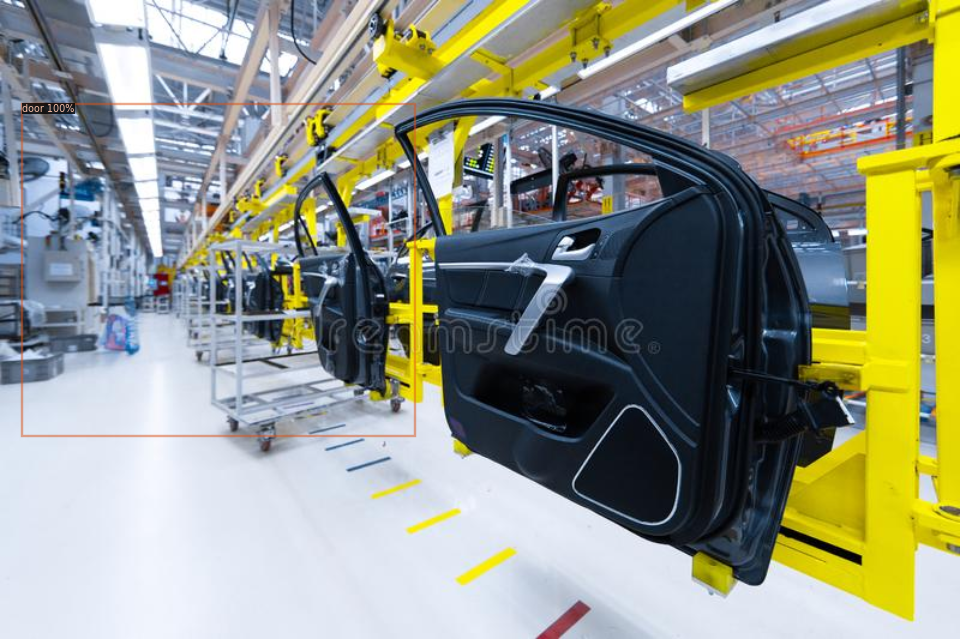

In [20]:
# We can use `Visualizer` to draw the predictions on the image.
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])